In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.special as scsp #import jv,jvp, yv,yvp, jnjnp_zeros, jnp_zeros
import plotly.graph_objects as go
from cavity import plot_cavity_field_3D, plot_cavity_field_2D

## Plot the TE of cylindrical cavity


Cavity's dimension:

    Radius R = 11mm
    Heigth H = 22mm

In [2]:
a = 11e-3
L = 22e-3

In [3]:
eps0 = 8.85*1e-12  # Farad/m
mu0 = 4*np.pi*1e-7 # H/m

Defining the mode

In [4]:
m = 3 # 0,1,2,3,...
n = 1 # 1,2,3,...
p = 1 # 1,2,3,...

Cavity boundary to plot

In [5]:
# Circle parameters
center_bottom = np.array([0, 0, 0])
center_top = np.array([0, 0, L])
theta = np.linspace(0, 2 * np.pi, 101)

# Circle in XY plane
bottom_circle_x = center_bottom[0] + a * np.cos(theta)
bottom_circle_y = center_bottom[1] + a * np.sin(theta)
bottom_circle_z = np.full_like(bottom_circle_x, center_bottom[2])  # constant z for XY plane

top_circle_x = center_top[0] + a * np.cos(theta)
top_circle_y = center_top[1] + a * np.sin(theta)
top_circle_z = np.full_like(bottom_circle_x, center_top[2])  # constant z for XY plane

### Preparation of coordinate

In [6]:
npoint = 21
x = np.linspace(-a, a, npoint) + 1e-10
y = np.linspace(-a, a, npoint) + 1e-10
z = np.linspace(0, L, npoint)

X_,Y_,Z_ = np.meshgrid(x, y, z, indexing='ij')
phi_ = np.arctan2(Y_, X_)
rho_ = np.sqrt(X_**2 + Y_**2)

X_flatten = X_.flatten()
Y_flatten = Y_.flatten()
Z_flatten = Z_.flatten()

flatten_ind = (X_flatten**2 + Y_flatten**2) <= a**2
X_flatten = X_flatten[flatten_ind]
Y_flatten = Y_flatten[flatten_ind]
Z_flatten = Z_flatten[flatten_ind]

# Transverse Electric (TEz) modes


In [7]:
Beta_rho = scsp.jnp_zeros(m,n)[-1]/a
Beta_z = p*np.pi/L

In [8]:
Beta = np.sqrt(Beta_rho**2 + Beta_z**2)
omega = Beta*3e8
f_0 = omega/2/np.pi
print(f'Resonance frequency: {f_0/1e9} GHz')

Resonance frequency: 19.468590699361464 GHz


In [9]:
# Polarization
C2 = 1
D2 = 0
# Coef
A_mn = 1e-12

### E-field

$$
E_{\rho}^{+} = -\frac{1}{\varepsilon \rho}\frac{\partial F_{z}^{+}}{\partial \phi}
= -A_{mn}\frac{m}{\varepsilon \rho} J_m(\beta_\rho \rho)\big[-C_2 \sin(m\phi) + D_2 \cos(m\phi)\big] e^{-j\beta_z z}
$$

$$
E_{\phi}^{+} = \frac{1}{\varepsilon}\frac{\partial F_{z}^{+}}{\partial \rho}
= A_{mn}\frac{\beta_\rho}{\varepsilon} J_m'(\beta_\rho \rho)\big[C_2 \cos(m\phi) + D_2 \sin(m\phi)\big] e^{-j\beta_z z}
$$

$$
E_{z}^{+} = 0
$$


In [10]:
E_rho_TEz = -A_mn * m / eps0 / rho_ * scsp.jv(m, Beta_rho * rho_) * (- C2 * np.sin(m*phi_) + D2 * np.cos(m*phi_)) *  np.sin(Beta_z*Z_)
E_phi_TEz = A_mn * Beta_rho / eps0 * scsp.jvp(m, Beta_rho * rho_, 1) * (C2 * np.cos(m*phi_) + D2 * np.sin(m*phi_)) * np.sin(Beta_z*Z_)
E_X_TEz = - np.sin(phi_) * E_phi_TEz + np.cos(phi_) * E_rho_TEz
E_Y_TEz = + np.cos(phi_) * E_phi_TEz + np.sin(phi_) * E_rho_TEz
E_X_TEz[X_**2 + Y_**2 > a**2] = 0
E_Y_TEz[X_**2 + Y_**2 > a**2] = 0
E_Z_TEz = np.zeros(Z_.shape)

### H-field

$$
H_{\rho}^{+} = -j \frac{1}{\omega \mu \varepsilon} \frac{\partial^2 F_{z}^{+}}{\partial \rho \, \partial z}
= -A_{mn}\frac{\beta_\rho \beta_z}{\omega \mu \varepsilon} J_m'(\beta_\rho \rho)\big[C_2 \cos(m\phi) + D_2 \sin(m\phi)\big] e^{-j\beta_z z}
$$

$$
H_{\phi}^{+} = -j \frac{1}{\omega \mu \varepsilon}\frac{1}{\rho}\frac{\partial^2 F_{z}^{+}}{\partial \phi \, \partial z}
= -A_{mn}\frac{m \beta_z}{\omega \mu \varepsilon}\frac{1}{\rho} J_m(\beta_\rho \rho) \big[-C_2 \sin(m\phi) + D_2 \cos(m\phi)\big] e^{-j\beta_z z}
$$

$$
H_{z}^{+} = -j \frac{1}{\omega \mu \varepsilon} \left( \frac{\partial^2}{\partial z^2} + \beta^2 \right) F_{z}^{+}
= -j A_{mn} \frac{\beta_\rho^2}{\omega \mu \varepsilon} J_m(\beta_\rho \rho) \big[C_2 \cos(m\phi) + D_2 \sin(m\phi)\big] e^{-j\beta_z z}
$$

In [11]:
H_rho_TEz =  A_mn * Beta_rho * Beta_z /(eps0 * mu0 * omega) * scsp.jvp(m, Beta_rho * rho_, 1) * (C2 * np.cos(m*phi_) + D2 * np.sin(m*phi_)) * np.cos(Beta_z*Z_)
H_phi_TEz = A_mn * m * Beta_z/(eps0 * mu0 * omega) / rho_ * scsp.jv(m, Beta_rho * rho_) * (- C2 * np.sin(m*phi_) + D2 * np.cos(m*phi_)) * np.cos(Beta_z*Z_)
H_Z_TEz = A_mn * Beta_rho**2/(eps0 * mu0 * omega) * scsp.jv(m, Beta_rho * rho_) * (C2 * np.cos(m*phi_) + D2 * np.sin(m*phi_)) * np.sin(Beta_z*Z_)
H_X_TEz = - np.sin(phi_) * H_phi_TEz + np.cos(phi_) * H_rho_TEz
H_Y_TEz = + np.cos(phi_) * H_phi_TEz + np.sin(phi_) * H_rho_TEz
H_X_TEz[X_**2 + Y_**2 > a**2] = 0
H_Y_TEz[X_**2 + Y_**2 > a**2] = 0
H_Z_TEz[X_**2 + Y_**2 > a**2] = 0

Plot 3D and 2D fields

In [12]:
plot_cavity_field_3D(E_X_TEz, E_Y_TEz, E_Z_TEz, H_X_TEz, H_Y_TEz, H_Z_TEz, X_, Y_, Z_, a, L, m, n, p, f_0, scale_H = 3)

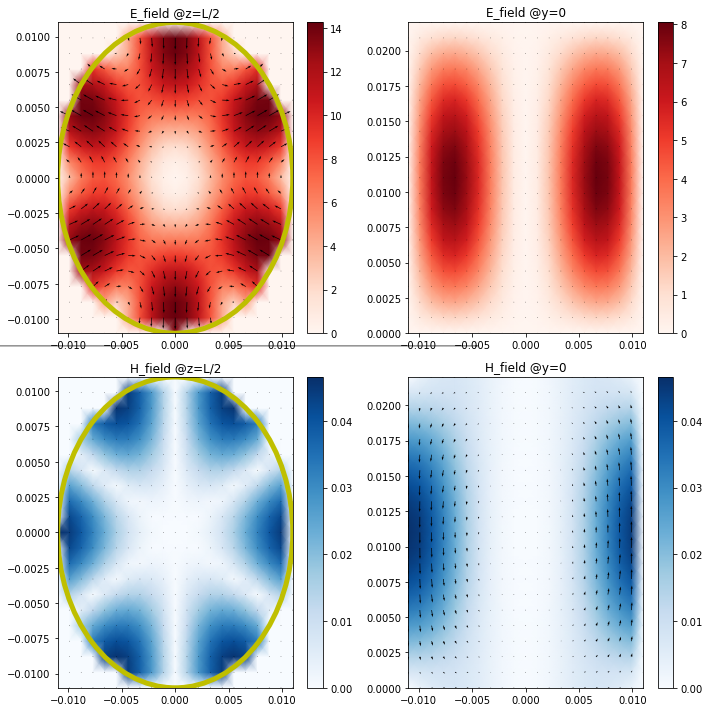

In [13]:
plot_cavity_field_2D(E_X_TEz, E_Y_TEz, E_Z_TEz, H_X_TEz, H_Y_TEz, H_Z_TEz, X_, Y_, Z_, a, L, int(npoint/2))

# Transverse Magnetic (TMz) modes


In [14]:
Beta_rho = scsp.jn_zeros(m,n)[-1]/a
Beta_z = p*np.pi/L

In [15]:
Beta = np.sqrt(Beta_rho**2 + Beta_z**2)
omega = Beta*3e8
f_0 = omega/2/np.pi
print(f'Resonance frequency: {f_0/1e9} GHz')

Resonance frequency: 28.520634000466938 GHz


In [16]:
# Polarization
C2 = 1
D2 = 0
# Coef
B_mn = 1e-10


### E-field

$$
E_{\rho}^{+} = -j \frac{1}{\omega \mu \varepsilon} \frac{\partial^2 A_{z}^{+}}{\partial \rho \, \partial z}
= -B_{mn}\frac{\beta_\rho \beta_z}{\omega \mu \varepsilon} J_m'(\beta_\rho \rho)\big[C_2 \cos(m\phi) + D_2 \sin(m\phi)\big] e^{-j\beta_z z}
$$

$$
E_{\phi}^{+} = -j \frac{1}{\omega \mu \varepsilon}\frac{1}{\rho}\frac{\partial^2 A_{z}^{+}}{\partial \phi \, \partial z}
= -B_{mn}\frac{m \beta_z}{\omega \mu \varepsilon}\frac{1}{\rho} J_m(\beta_\rho \rho) \big[-C_2 \sin(m\phi) + D_2 \cos(m\phi)\big] e^{-j\beta_z z}
$$

$$
E_{z}^{+} = -j \frac{1}{\omega \mu \varepsilon} \left( \frac{\partial^2}{\partial z^2} + \beta^2 \right) A_{z}^{+}
= -j B_{mn} \frac{\beta_\rho^2}{\omega \mu \varepsilon} J_m(\beta_\rho \rho) \big[C_2 \cos(m\phi) + D_2 \sin(m\phi)\big] e^{-j\beta_z z}
$$

In [17]:
E_rho_TMz = -B_mn * Beta_rho * Beta_z/(eps0 * mu0 * omega) * scsp.jvp(m, Beta_rho * rho_, 1) * (C2 * np.cos(m*phi_) + D2 * np.sin(m*phi_)) * np.cos(Beta_z*Z_)
E_phi_TMz = -B_mn * m * Beta_z/(eps0 * mu0 * omega) / rho_ * scsp.jv(m, Beta_rho * rho_) * (- C2 * np.sin(m*phi_) + D2 * np.cos(m*phi_)) * np.cos(Beta_z*Z_)
E_Z_TMz = -B_mn * Beta_rho**2/(eps0 * mu0 * omega) * scsp.jv(m, Beta_rho * rho_) * (C2 * np.cos(m*phi_) + D2 * np.sin(m*phi_)) * np.sin(Beta_z*Z_)
E_X_TMz = - np.sin(phi_) * E_phi_TMz + np.cos(phi_) * E_rho_TMz
E_Y_TMz = + np.cos(phi_) * E_phi_TMz + np.sin(phi_) * E_rho_TMz
E_X_TMz[X_**2 + Y_**2 > a**2] = 0
E_Y_TMz[X_**2 + Y_**2 > a**2] = 0
E_Z_TMz[X_**2 + Y_**2 > a**2] = 0

### H-field

$$
H_{\rho}^{+} = \frac{1}{\mu \rho}\frac{\partial A_{z}^{+}}{\partial \phi}
= B_{mn}\frac{m}{\mu \rho} J_m(\beta_\rho \rho)\big[-C_2 \sin(m\phi) + D_2 \cos(m\phi)\big] e^{-j\beta_z z}
$$

$$
H_{\phi}^{+} = -\frac{1}{\mu}\frac{\partial A_{z}^{+}}{\partial \rho}
= -B_{mn}\frac{\beta_\rho}{\mu} J_m'(\beta_\rho \rho)\big[C_2 \cos(m\phi) + D_2 \sin(m\phi)\big] e^{-j\beta_z z}
$$

$$
H_{z}^{+} = 0
$$


In [18]:
H_rho_TMz = B_mn * m / mu0 / rho_ * scsp.jv(m, Beta_rho * rho_) * (- C2 * np.sin(m*phi_) + D2 * np.cos(m*phi_)) *  np.sin(Beta_z*Z_)
H_phi_TMz = -B_mn * Beta_rho / mu0 * scsp.jvp(m, Beta_rho * rho_, 1) * (C2 * np.cos(m*phi_) + D2 * np.sin(m*phi_)) * np.sin(Beta_z*Z_)
H_X_TMz = - np.sin(phi_) * H_phi_TMz + np.cos(phi_) * H_rho_TMz
H_Y_TMz = + np.cos(phi_) * H_phi_TMz + np.sin(phi_) * H_rho_TMz
H_Z_TMz = np.zeros(Z_.shape)
H_X_TMz[X_**2 + Y_**2 > a**2] = 0
H_Y_TMz[X_**2 + Y_**2 > a**2] = 0
H_Z_TMz[X_**2 + Y_**2 > a**2] = 0

Plot 3D and 2D fields

In [19]:
plot_cavity_field_3D(E_X_TMz, E_Y_TMz, E_Z_TMz, H_X_TMz, H_Y_TMz, H_Z_TMz, X_, Y_, Z_, a, L, m, n, p, f_0, scale_E = 3)

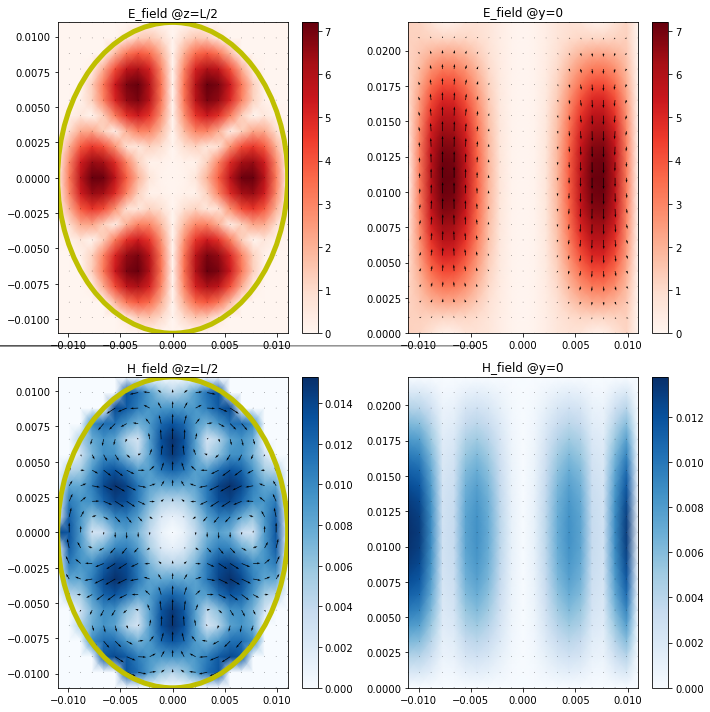

In [20]:
plot_cavity_field_2D(E_X_TMz, E_Y_TMz, E_Z_TMz, H_X_TMz, H_Y_TMz, H_Z_TMz, X_, Y_, Z_, a, L, int(npoint/2))